In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import sys

In [5]:
def display_images_grid(images, no_of_columns = 3, figsize=(10, 10)):
    fig = plt.figure(figsize=figsize)
    column = 0
    for i in range(len(images)):
        column += 1
        if column == no_of_columns+1:
            fig = plt.figure(figsize=figsize)
            column = 1
        fig.add_subplot(1, no_of_columns, column)
        plt.imshow(images[i])
        plt.axis('off')

In [6]:
cap = cv.VideoCapture('../../data/Video/files_to_test_motion_algos/raws_Breaking_Bad_s01e01-10.mkv')
if not cap.isOpened():
    print("video file opening is failed")
    sys.exit()

ret, prev_frame = cap.read()
if ret is False:
    print("reading frame is failed")
    sys.exit()

Reached to last frame in video


/home/dell/plaidml/local/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


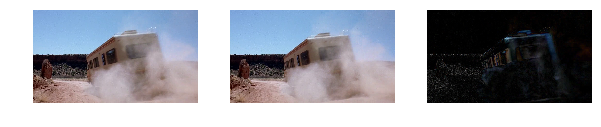

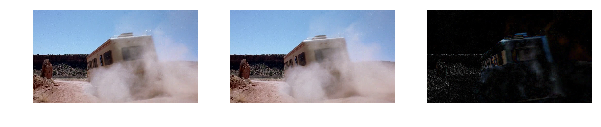

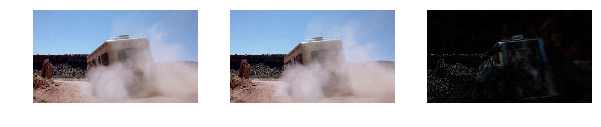

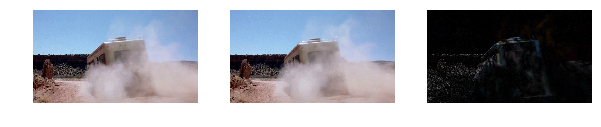

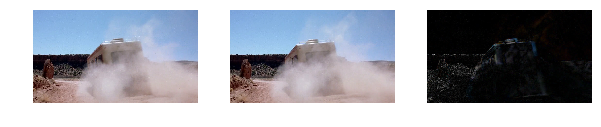

...

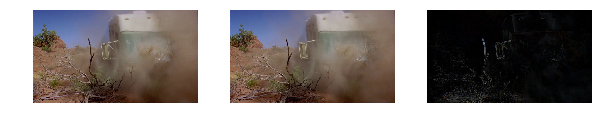

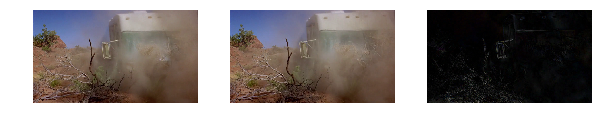

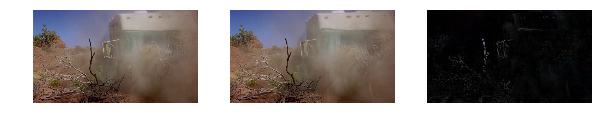

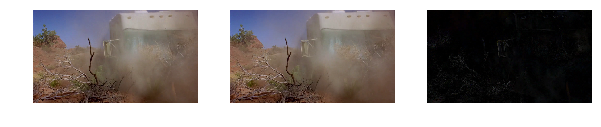

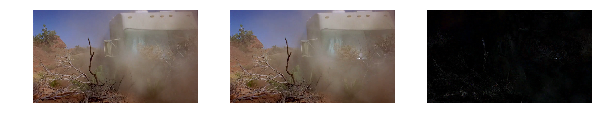

In [7]:
images = []
while ret != False:
    ret, curr_frame = cap.read()
    
    if ret is False:
        print("Reached to last frame in video")
        break
        
    diff_img = cv.absdiff(prev_frame, curr_frame)
    #display_image(diff_img)
    images.append(prev_frame)
    images.append(curr_frame)
    images.append(diff_img)
    
    prev_frame = curr_frame
    
images = [cv.cvtColor(img, cv.COLOR_BGR2RGB) for img in images]
display_images_grid(images, 3, (10, 10))

cap.release()
cv.destroyAllWindows()